Loading billsmafia.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/billsmafia.jpeg: 640x512 9 persons, 1 car, 2 trucks, 2 umbrellas, 1495.1ms
Speed: 44.7ms preprocess, 1495.1ms inference, 18.0ms postprocess per image at shape (1, 3, 640, 512)
--------------------------------------------------
DETECTION SUMMARY (14 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 0.94       | [0, 500, 259, 940]
person          | 0.92       | [266, 523, 559, 940]
person          | 0.82       | [217, 459, 345, 928]
person          | 0.78       | [485, 742, 729, 941]
person          | 0.59       | [0, 427, 79, 658]
umbrella        | 0.56       | [0, 295, 273, 392]
truck           | 0.54       | [429, 350, 584, 395]
person          | 0.43       | [512, 455, 673, 762]
person          | 0.32       | [83, 429, 163, 515]
person          | 0.31       | [212, 387, 261, 489]
truck           | 0.3        | [316,

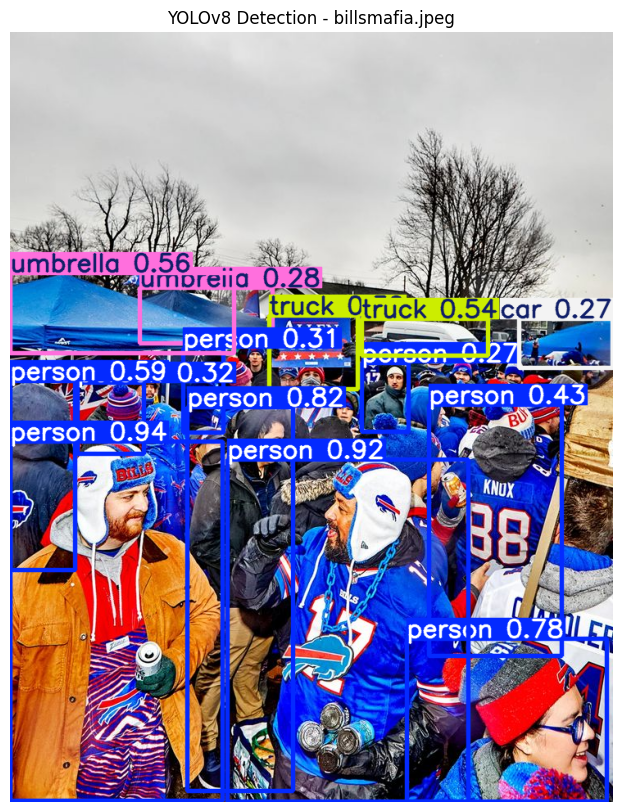



Loading billsmafia.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (25 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 1.00       | [3, 488, 261, 935]
person          | 0.99       | [280, 522, 548, 929]
person          | 0.97       | [218, 457, 352, 939]
person          | 0.94       | [0, 421, 74, 653]
person          | 0.93       | [522, 746, 718, 939]
person          | 0.93       | [147, 425, 228, 622]
person          | 0.91       | [86, 423, 166, 522]
umbrella        | 0.86       | [640, 353, 734, 396]
person          | 0.85       | [216, 385, 280, 492]
person          | 0.82       | [644, 412, 734, 651]
person          | 0.80       | [520, 440, 685, 713]
person          | 0.79       | [275, 423, 369, 537]
person          | 0.77       | [432, 402, 488, 487]
person          | 0.75       | [149, 412, 1

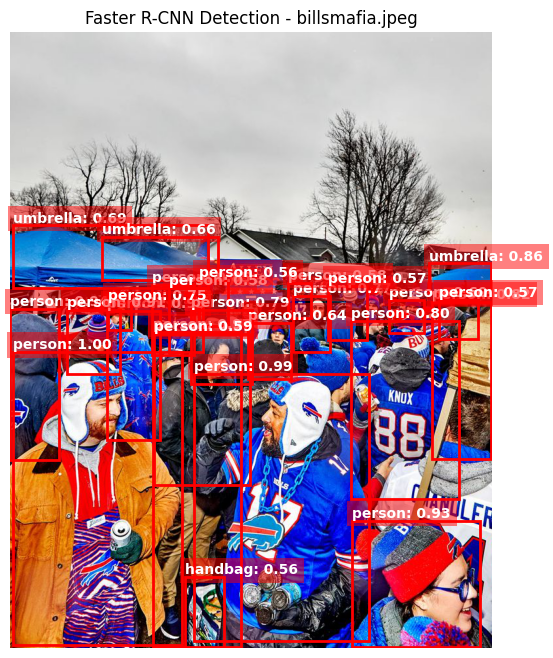

In [45]:
# NFL Football Tailgating

# Image file Path for more efficient and compressed code
image_path = "billsmafia.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading brasil praia.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/brasil praia.jpeg: 640x384 9 persons, 1 bench, 6 umbrellas, 1 cup, 1 chair, 5 dining tables, 1 vase, 1025.5ms
Speed: 5.8ms preprocess, 1025.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)
--------------------------------------------------
DETECTION SUMMARY (24 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 0.88       | [146, 611, 182, 691]
dining table    | 0.87       | [0, 777, 580, 1306]
person          | 0.82       | [412, 617, 439, 683]
vase            | 0.79       | [240, 721, 397, 882]
person          | 0.77       | [378, 626, 407, 685]
person          | 0.75       | [359, 632, 384, 688]
person          | 0.69       | [641, 621, 675, 678]
umbrella        | 0.59       | [70, 588, 136, 623]
person          | 0.59       | [65, 646, 111, 686]
bench           | 0.59       | [634, 740, 735, 8

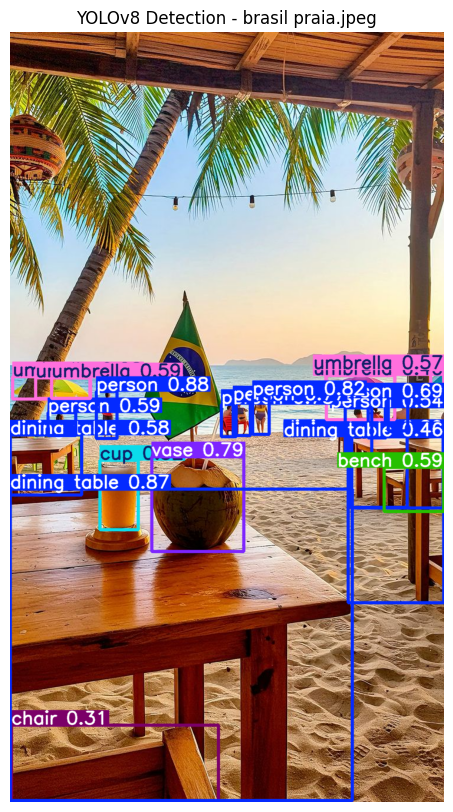



Loading brasil praia.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (29 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 1.00       | [411, 618, 439, 683]
person          | 1.00       | [146, 610, 182, 689]
person          | 0.99       | [375, 625, 406, 686]
person          | 0.99       | [63, 646, 105, 686]
person          | 0.98       | [357, 632, 383, 689]
umbrella        | 0.96       | [535, 582, 654, 664]
dining table    | 0.94       | [582, 679, 729, 814]
cup             | 0.93       | [151, 722, 218, 853]
person          | 0.93       | [639, 621, 675, 679]
dining table    | 0.91       | [663, 673, 735, 964]
person          | 0.91       | [606, 633, 637, 687]
umbrella        | 0.90       | [70, 587, 134, 625]
dining table    | 0.89       | [0, 722, 624, 1284]
vase            | 0.88       | [239, 7

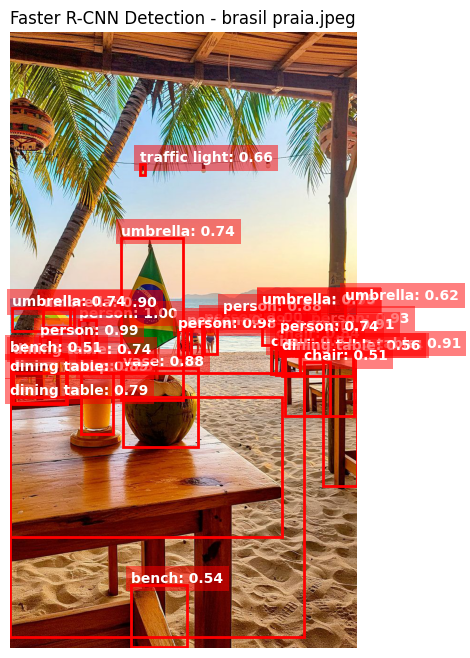

In [46]:
# Beach in Brazil

# Image file Path for more efficient and compressed code
image_path = "brasil praia.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading bear.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/bear.jpeg: 640x608 1 bear, 3 bottles, 1 cup, 2395.6ms
Speed: 9.6ms preprocess, 2395.6ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 608)
--------------------------------------------------
DETECTION SUMMARY (5 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
bear            | 0.75       | [66, 229, 615, 685]
bottle          | 0.59       | [190, 573, 304, 663]
bottle          | 0.5        | [601, 603, 664, 654]
bottle          | 0.43       | [1, 537, 60, 596]
cup             | 0.36       | [190, 573, 304, 662]
--------------------------------------------------


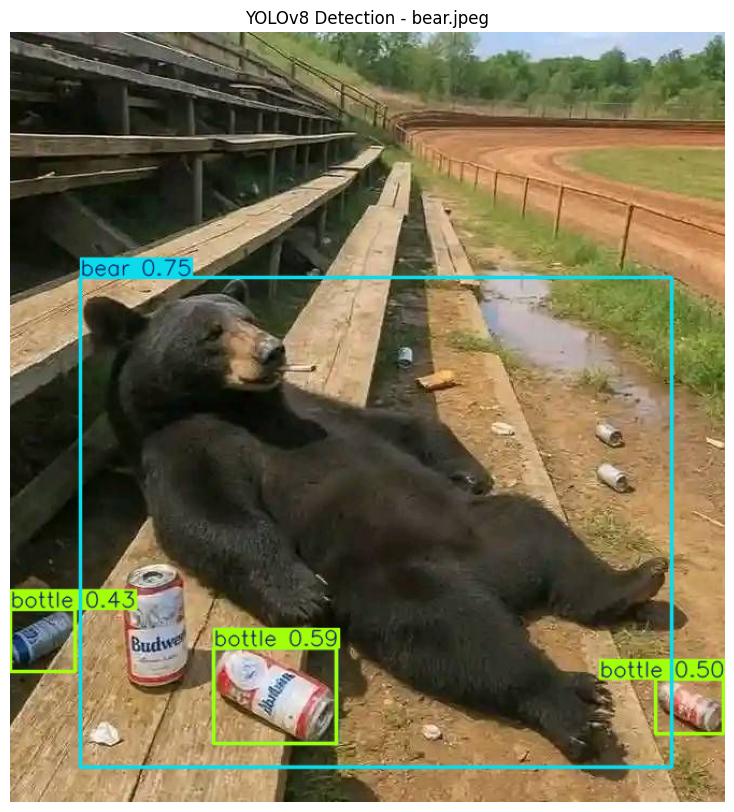



Loading bear.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (4 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
bottle          | 0.98       | [1, 536, 61, 594]
bottle          | 0.97       | [599, 601, 663, 652]
bottle          | 0.91       | [190, 565, 304, 663]
bear            | 0.78       | [34, 234, 635, 650]
--------------------------------------------------


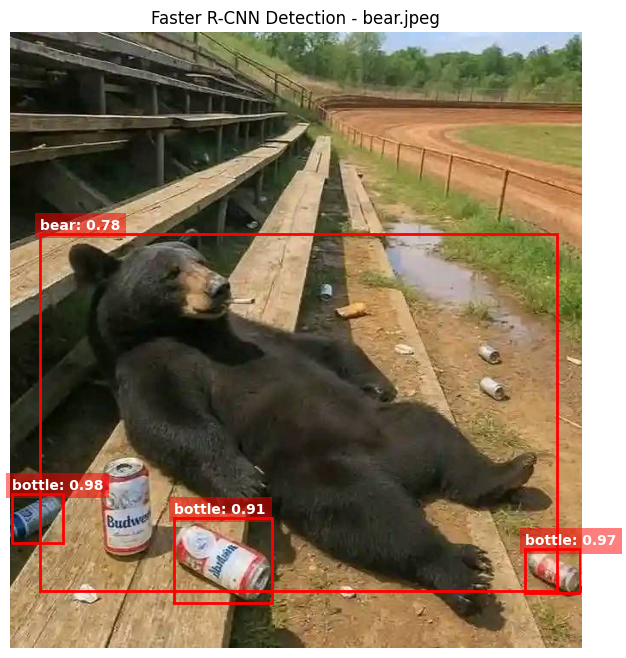

In [54]:
# Bears

# Image file Path for more efficient and compressed code
image_path = "bear.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading data.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/data.jpeg: 640x448 6 persons, 3 cups, 3 chairs, 2 couchs, 1 tv, 2 laptops, 882.2ms
Speed: 2.9ms preprocess, 882.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)
--------------------------------------------------
DETECTION SUMMARY (17 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 0.89       | [373, 558, 606, 876]
laptop          | 0.87       | [386, 641, 483, 696]
person          | 0.86       | [602, 444, 712, 867]
person          | 0.86       | [69, 436, 190, 705]
chair           | 0.85       | [464, 667, 640, 898]
person          | 0.84       | [0, 579, 208, 900]
chair           | 0.81       | [255, 681, 418, 912]
person          | 0.77       | [694, 427, 736, 773]
couch           | 0.76       | [586, 923, 735, 1051]
chair           | 0.72       | [10, 699, 172, 859]
couch           | 0.7        | [

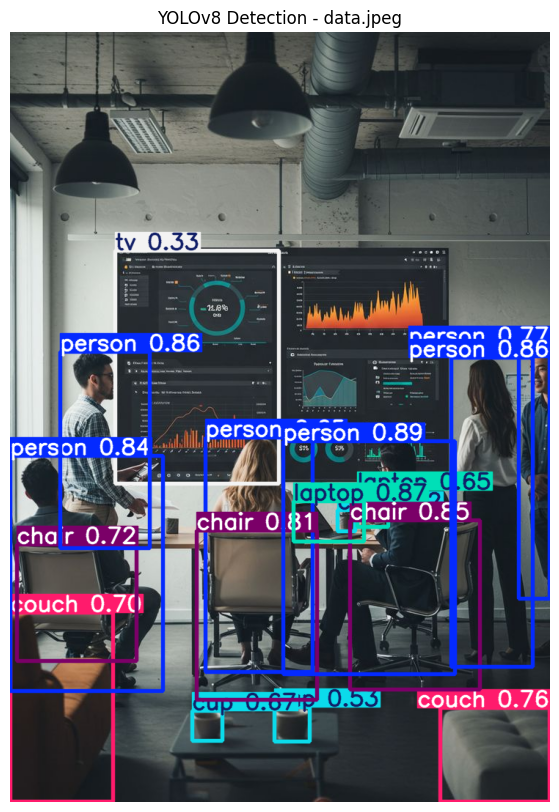



Loading data.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (22 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 1.00       | [603, 443, 715, 871]
laptop          | 0.99       | [380, 641, 484, 699]
person          | 0.99       | [65, 434, 193, 724]
person          | 0.99       | [365, 552, 604, 889]
chair           | 0.99       | [257, 679, 396, 918]
chair           | 0.98       | [485, 660, 626, 905]
person          | 0.98       | [693, 430, 733, 792]
chair           | 0.96       | [9, 693, 159, 867]
cup             | 0.96       | [248, 925, 292, 967]
person          | 0.95       | [266, 568, 409, 848]
person          | 0.95       | [39, 454, 204, 906]
cup             | 0.95       | [447, 653, 469, 681]
person          | 0.93       | [263, 552, 407, 700]
couch           | 0.92       | [584, 920, 736, 

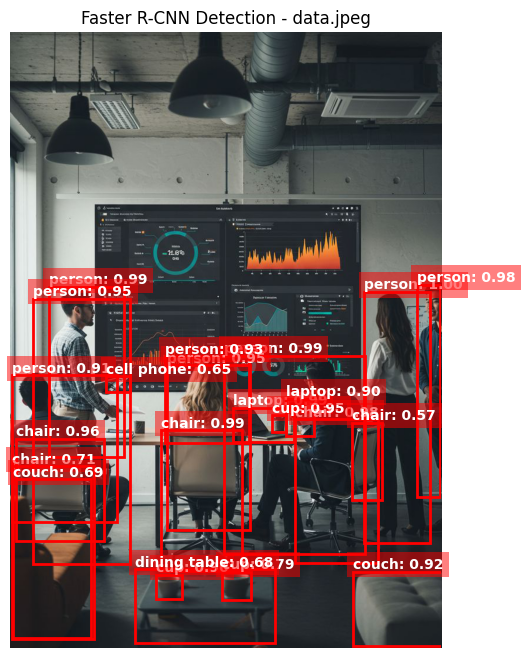

In [48]:
# Data Analytics Meeting

# Image file Path for more efficient and compressed code
image_path = "data.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading dog.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/dog.jpeg: 640x384 1 dog, 1272.6ms
Speed: 2.6ms preprocess, 1272.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)
--------------------------------------------------
DETECTION SUMMARY (1 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
dog             | 0.95       | [0, 5, 472, 784]
--------------------------------------------------


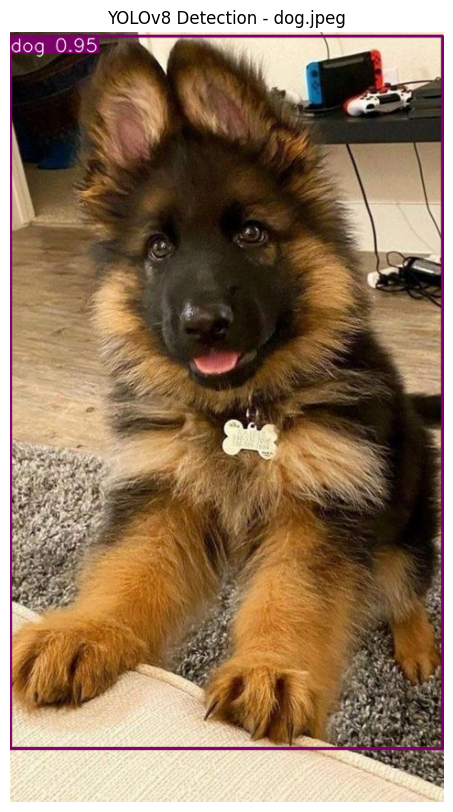



Loading dog.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (3 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
dog             | 0.98       | [13, 3, 469, 801]
cell phone      | 0.92       | [322, 20, 404, 85]
remote          | 0.92       | [366, 61, 438, 91]
--------------------------------------------------


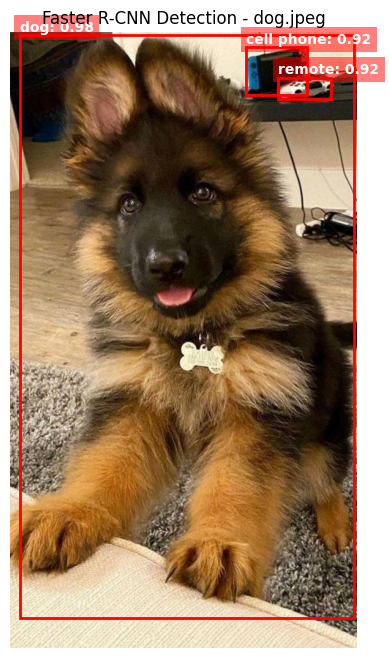

In [49]:
# Dog

# Image file Path for more efficient and compressed code
image_path = "dog.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

In [ ]:
# New York City traffic

# Image file Path for more efficient and compressed code
image_path = "NYC.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading soccer.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/soccer.jpeg: 640x480 2 frisbees, 4 sports balls, 1076.0ms
Speed: 5.0ms preprocess, 1076.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)
--------------------------------------------------
DETECTION SUMMARY (6 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
sports ball     | 0.93       | [274, 588, 390, 712]
sports ball     | 0.88       | [532, 583, 601, 707]
frisbee         | 0.85       | [437, 772, 573, 871]
sports ball     | 0.78       | [447, 719, 585, 858]
frisbee         | 0.75       | [446, 720, 585, 858]
sports ball     | 0.36       | [326, 618, 363, 654]
--------------------------------------------------


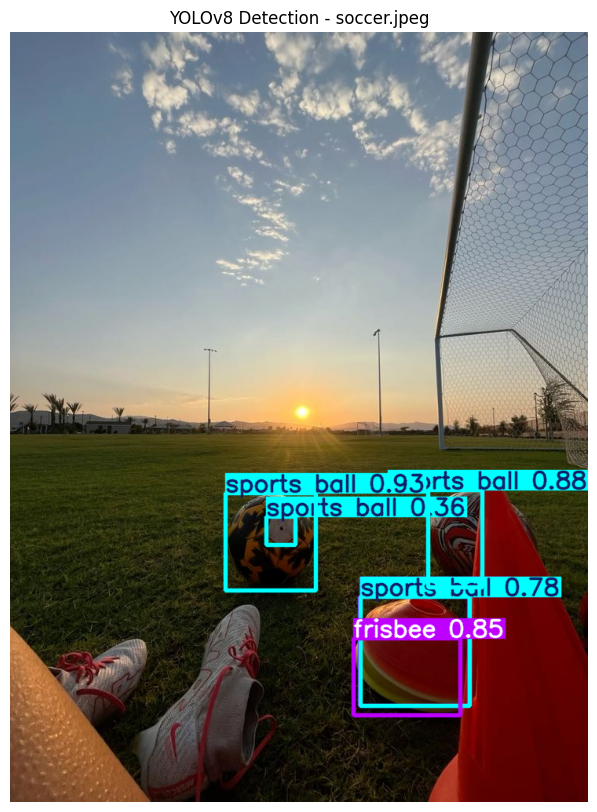



Loading soccer.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (3 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
sports ball     | 0.99       | [532, 585, 600, 706]
sports ball     | 0.99       | [275, 588, 388, 705]
frisbee         | 0.98       | [438, 738, 584, 868]
--------------------------------------------------


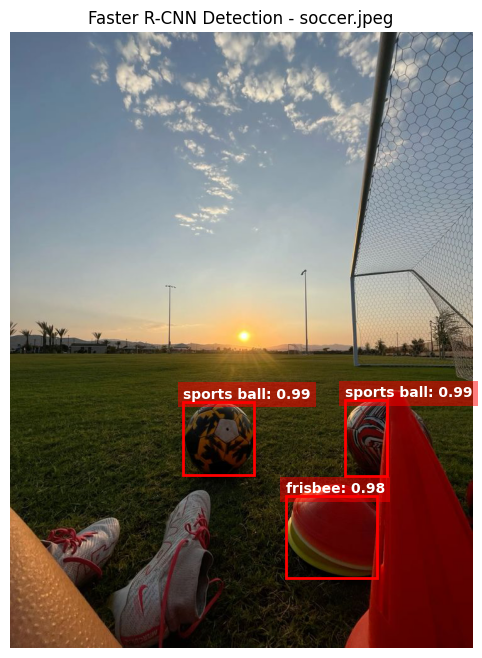

In [50]:
# Soccer with sunset

# Image file Path for more efficient and compressed code
image_path = "soccer.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading surf shop.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/surf shop.jpeg: 640x480 34 surfboards, 994.9ms
Speed: 16.1ms preprocess, 994.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
--------------------------------------------------
DETECTION SUMMARY (34 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
surfboard       | 0.78       | [277, 309, 343, 454]
surfboard       | 0.66       | [160, 254, 216, 453]
surfboard       | 0.57       | [722, 318, 736, 574]
surfboard       | 0.56       | [471, 300, 503, 520]
surfboard       | 0.54       | [643, 307, 675, 556]
surfboard       | 0.52       | [387, 284, 432, 537]
surfboard       | 0.5        | [506, 304, 539, 520]
surfboard       | 0.49       | [619, 315, 653, 553]
surfboard       | 0.48       | [0, 41, 85, 97]
surfboard       | 0.47       | [616, 308, 645, 554]
surfboard       | 0.46       | [537, 307, 573, 513]
surfboard   

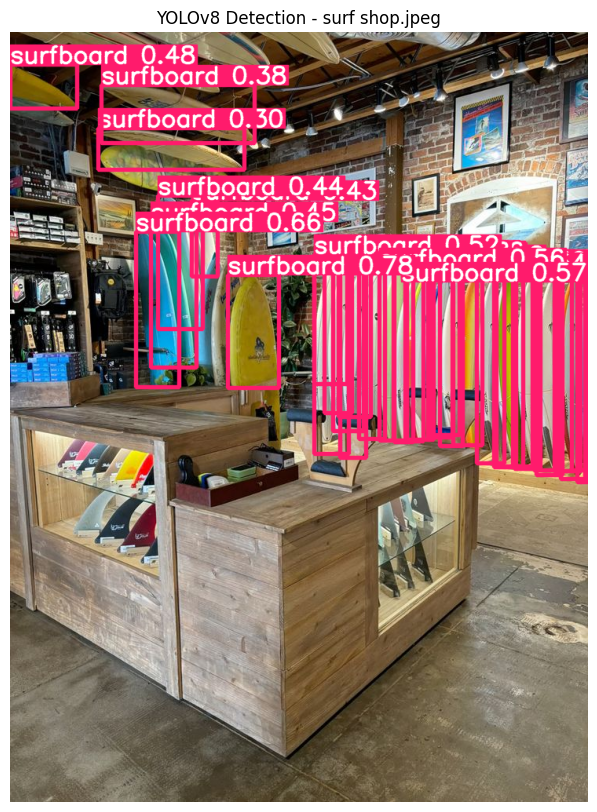



Loading surf shop.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (37 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
surfboard       | 0.99       | [609, 308, 629, 553]
surfboard       | 0.98       | [617, 303, 651, 556]
surfboard       | 0.98       | [470, 296, 503, 533]
surfboard       | 0.98       | [499, 299, 536, 518]
surfboard       | 0.98       | [569, 304, 601, 524]
surfboard       | 0.98       | [644, 305, 679, 551]
surfboard       | 0.98       | [536, 303, 568, 520]
surfboard       | 0.97       | [274, 300, 341, 455]
surfboard       | 0.97       | [167, 235, 225, 443]
surfboard       | 0.95       | [664, 301, 696, 548]
surfboard       | 0.94       | [392, 274, 440, 519]
surfboard       | 0.94       | [239, 274, 268, 436]
surfboard       | 0.93       | [694, 297, 727, 567]
surfboard       | 0.93       | [661, 3

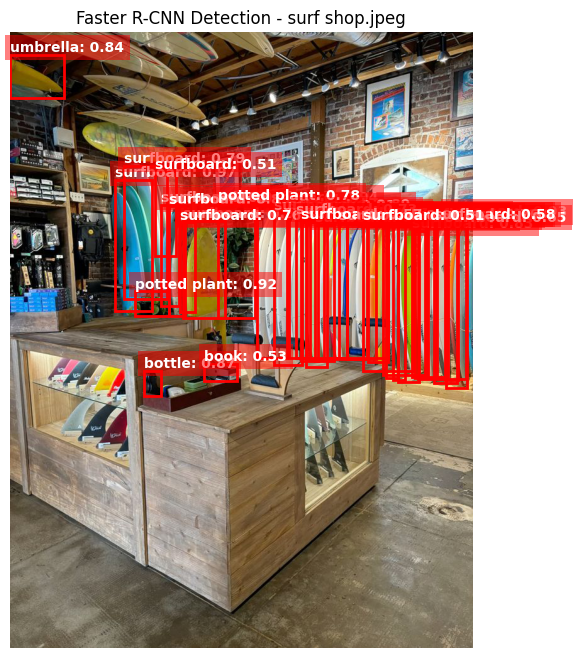

In [51]:
# Surf Shop

# Image file Path for more efficient and compressed code
image_path = "surf shop.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading thanksgiving.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/thanksgiving.jpeg: 640x384 1 bottle, 5 wine glasss, 2 cups, 2 forks, 2 knifes, 2 spoons, 17 bowls, 3 chairs, 1 potted plant, 1 dining table, 3 vases, 1081.9ms
Speed: 7.0ms preprocess, 1081.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 384)
--------------------------------------------------
DETECTION SUMMARY (39 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
dining table    | 0.97       | [1, 414, 736, 1304]
bowl            | 0.94       | [534, 547, 733, 672]
bowl            | 0.94       | [293, 761, 475, 905]
bowl            | 0.92       | [279, 897, 445, 1024]
bowl            | 0.91       | [567, 904, 689, 1030]
bowl            | 0.89       | [1, 789, 275, 1014]
fork            | 0.88       | [661, 1142, 714, 1295]
bowl            | 0.88       | [38, 527, 138, 607]
bowl            | 0.87       | [464, 848, 585, 

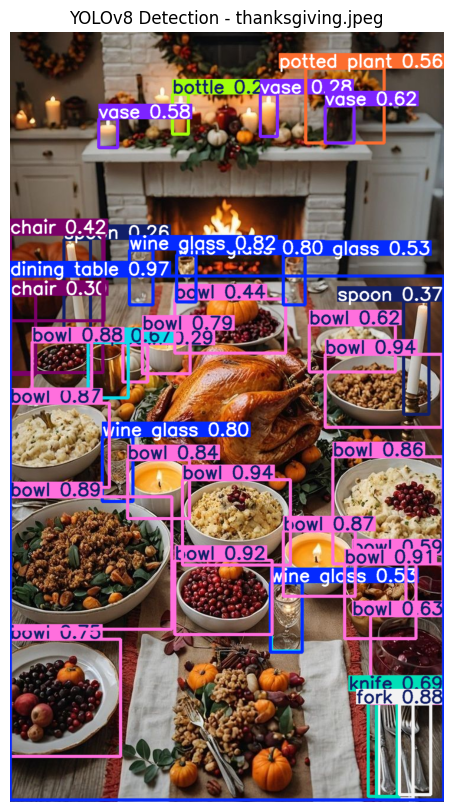



Loading thanksgiving.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (43 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
bowl            | 0.99       | [280, 893, 444, 1022]
bowl            | 0.99       | [291, 764, 470, 899]
bowl            | 0.98       | [550, 725, 732, 909]
bowl            | 0.98       | [565, 901, 691, 1027]
bowl            | 0.98       | [0, 787, 273, 1026]
bowl            | 0.98       | [0, 628, 170, 773]
bowl            | 0.97       | [534, 549, 698, 668]
wine glass      | 0.97       | [283, 375, 316, 450]
bowl            | 0.96       | [38, 523, 140, 607]
vase            | 0.95       | [532, 125, 583, 192]
dining table    | 0.92       | [0, 532, 736, 1283]
spoon           | 0.91       | [665, 461, 710, 632]
bowl            | 0.89       | [462, 845, 582, 958]
bowl            | 0.89       | [512, 4

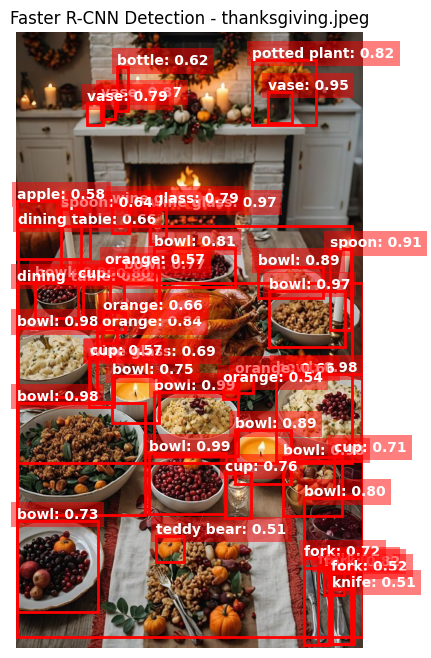

In [52]:
# Thanksgiving meal

# Image file Path for more efficient and compressed code
image_path = "thanksgiving.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()

Loading videogames.jpeg...

image 1/1 /Users/enzo/Downloads/Image_Analytics/videogames.jpeg: 640x480 5 persons, 2 bottles, 2 cups, 4 bowls, 1 dining table, 1 tv, 1 clock, 1633.9ms
Speed: 3.1ms preprocess, 1633.9ms inference, 18.0ms postprocess per image at shape (1, 3, 640, 480)
--------------------------------------------------
DETECTION SUMMARY (16 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
person          | 0.89       | [460, 584, 735, 980]
tv              | 0.87       | [525, 319, 736, 541]
bowl            | 0.84       | [343, 613, 406, 650]
bottle          | 0.83       | [438, 655, 465, 731]
bowl            | 0.82       | [290, 620, 328, 649]
clock           | 0.8        | [373, 190, 414, 239]
person          | 0.77       | [85, 546, 251, 709]
person          | 0.77       | [27, 674, 421, 981]
person          | 0.73       | [46, 492, 120, 650]
bowl            | 0.64       | [398, 708, 435, 738]
din

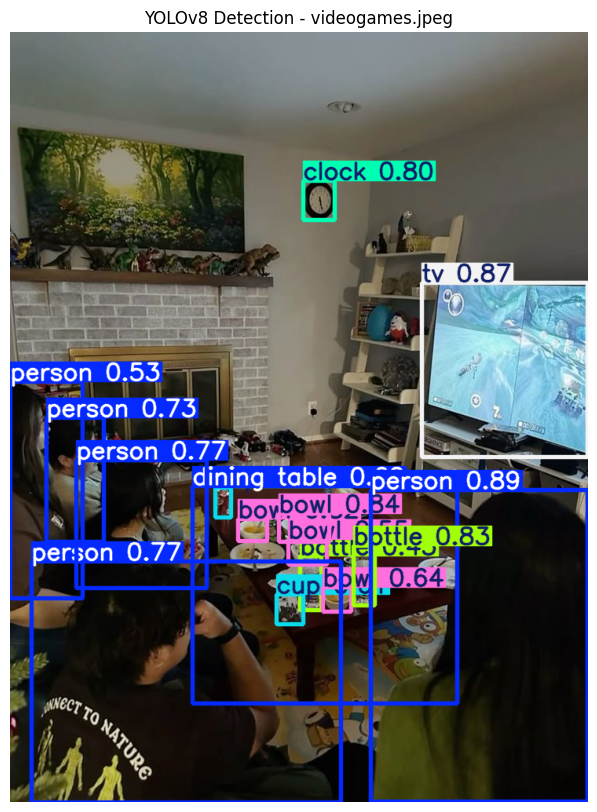



Loading videogames.jpeg...
Loading Faster R-CNN model...
Running object detection...
--------------------------------------------------
DETECTION SUMMARY (22 objects found):
Object          | Confidence | Coordinates [x1, y1, x2, y2]
--------------------------------------------------
clock           | 0.99       | [373, 188, 413, 239]
person          | 0.98       | [19, 662, 424, 975]
bowl            | 0.97       | [290, 621, 327, 649]
person          | 0.97       | [0, 452, 92, 964]
bottle          | 0.95       | [438, 654, 465, 732]
bowl            | 0.95       | [342, 613, 404, 650]
person          | 0.94       | [49, 480, 125, 655]
bottle          | 0.90       | [369, 660, 395, 737]
person          | 0.88       | [84, 541, 255, 716]
book            | 0.86       | [463, 508, 498, 528]
bowl            | 0.83       | [398, 707, 435, 739]
book            | 0.82       | [473, 499, 503, 525]
person          | 0.80       | [214, 716, 346, 915]
cup             | 0.79       | [359, 646, 4

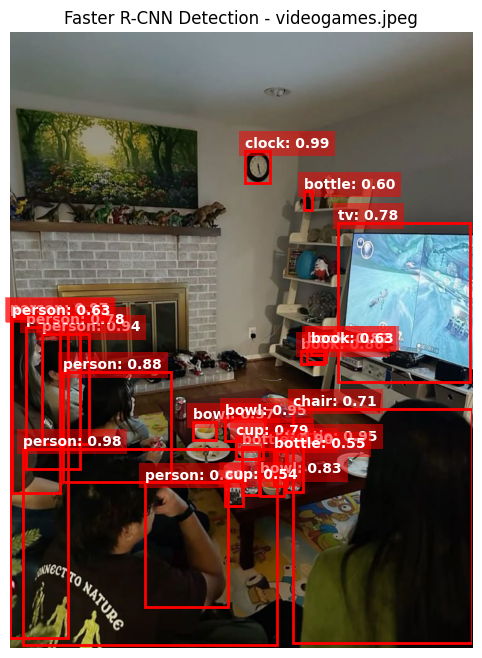

In [53]:
# Video Game night

# Image file Path for more efficient and compressed code
image_path = "videogames.jpeg"

######################################
######################################
######################################
######################################
# YOLO OBJECT DETECTION CODE 


# --- 1. SETUP
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg"
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_path = "bus.jpg" # Set to the sample name
    image.save(image_path)
else:
    print(f"Loading {image_path}...")

# --- 2. LOAD MODEL & INFERENCE ---
# Load the pre-trained YOLOv8 medium model
model = YOLO("yolov8m.pt") 

# Run prediction
# conf=0.25 sets a minimum confidence threshold
results = model.predict(image_path, conf=0.25) 
result = results[0]

# --- 3. PRINT TEXT RESULTS ---
print("-" * 50)
print(f"DETECTION SUMMARY ({len(result.boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

for box in result.boxes:
    # Get object class name
    class_id = int(box.cls[0].item())
    class_name = result.names[class_id]
    
    # Get confidence score (rounded to 2 decimals)
    confidence = round(box.conf[0].item(), 2)
    
    # Get coordinates (rounded to integers)
    cords = [round(x) for x in box.xyxy[0].tolist()]
    
    print(f"{class_name:<15} | {confidence:<10} | {cords}")

print("-" * 50)

# --- 4. DISPLAY IMAGE ---
# Generate the annotated image (plot() returns a BGR numpy array)
annotated_frame = result.plot()

# Convert BGR (OpenCV format) to RGB (Matplotlib format) for correct color display
annotated_frame_rgb = annotated_frame[..., ::-1]

# Display
plt.figure(figsize=(10, 10))
plt.imshow(annotated_frame_rgb)
plt.axis('off')
plt.title(f"YOLOv8 Detection - {image_path}")
plt.show()
print('\n')

######################################
######################################
######################################
######################################

# FASTER RCNN OBJECT DETECTION CODE

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO
import os

# --- 1. SETUP & LOAD IMAGE ---
# Try to load 'Athens.jpg', otherwise download a sample image

if not os.path.exists(image_path):
    print(f"'{image_path}' not found. Downloading sample image...")
    url = "https://ultralytics.com/images/bus.jpg" # Sample image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    image_path = "bus.jpg" # Set the name for display
    image.save(image_path)
else:
    print(f"Loading {image_path}...")
    image = Image.open(image_path).convert("RGB")

# Convert image to tensor and add batch dimension (B, C, H, W)
image_tensor = F.to_tensor(image).unsqueeze(0)

# --- 2. LOAD MODEL ---
# Load the pre-trained Faster R-CNN model with default COCO weights
print("Loading Faster R-CNN model...")
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Get class names from the model's metadata
coco_classes = weights.meta["categories"]

# --- 3. INFERENCE ---
print("Running object detection...")
with torch.no_grad():
    predictions = model(image_tensor)

# --- 4. PROCESS & DISPLAY RESULTS ---
# Extract results for the first (and only) image
prediction = predictions[0]
boxes = prediction['boxes']
scores = prediction['scores']
labels = prediction['labels']

# Filter results by confidence threshold
confidence_threshold = 0.5
mask = scores >= confidence_threshold
filtered_boxes = boxes[mask]
filtered_scores = scores[mask]
filtered_labels = labels[mask]

# Print text summary
print("-" * 50)
print(f"DETECTION SUMMARY ({len(filtered_boxes)} objects found):")
print(f"{'Object':<15} | {'Confidence':<10} | {'Coordinates [x1, y1, x2, y2]'}")
print("-" * 50)

# Setup plot
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)

for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
    x1, y1, x2, y2 = box.tolist()
    width = x2 - x1
    height = y2 - y1
    
    class_name = coco_classes[label.item()]
    
    # Print details to console
    print(f"{class_name:<15} | {score:.2f}       | {[int(x1), int(y1), int(x2), int(y2)]}")

    # Draw bounding box
    rect = patches.Rectangle(
        (x1, y1), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # Add label text with background
    ax.text(
        x1, y1 - 5,
        f"{class_name}: {score:.2f}",
        color='white', fontsize=10, weight='bold',
        bbox=dict(facecolor='red', alpha=0.5, edgecolor='none')
    )

print("-" * 50)
plt.axis("off")
plt.title(f"Faster R-CNN Detection - {image_path}")
plt.show()